# Start

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import scipy.stats as stats

In [2]:
df = pd.read_csv('House_Pred_train.csv')
df = df.drop(axis=1, columns='Id')

In [3]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
df.shape

(1460, 80)

In [5]:
for col in df.columns:
    percent = ((df[col].isnull().sum())/len(df))*100
    if percent>0:
        print(f'{col} \t {percent}')

LotFrontage 	 17.73972602739726
Alley 	 93.76712328767123
MasVnrType 	 0.547945205479452
MasVnrArea 	 0.547945205479452
BsmtQual 	 2.5342465753424657
BsmtCond 	 2.5342465753424657
BsmtExposure 	 2.6027397260273974
BsmtFinType1 	 2.5342465753424657
BsmtFinType2 	 2.6027397260273974
Electrical 	 0.0684931506849315
FireplaceQu 	 47.26027397260274
GarageType 	 5.5479452054794525
GarageYrBlt 	 5.5479452054794525
GarageFinish 	 5.5479452054794525
GarageQual 	 5.5479452054794525
GarageCond 	 5.5479452054794525
PoolQC 	 99.52054794520548
Fence 	 80.75342465753424
MiscFeature 	 96.30136986301369


Dropping Columns with Higher Missing Values

In [6]:
drop_cols = ['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']
df = df.drop(axis=1, columns=drop_cols)

In [7]:
df.shape

(1460, 75)

## NUMERICAL DF AND CATEGORIAL DF

In [8]:
numerical_df = df.select_dtypes(include=np.number)
categorial_df = df.select_dtypes(exclude=np.number)

# EDA

### Numerical

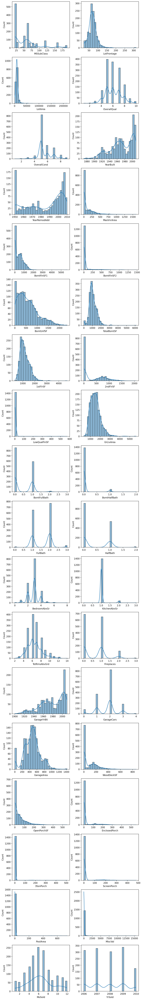

In [9]:
plt.figure(figsize=(10,80), dpi=200)
i=1
for col in numerical_df.columns[:-1]:
    plt.subplot(18,2,i)
    i+=1
    sns.histplot(kde=True, bins=30, x=numerical_df[col])

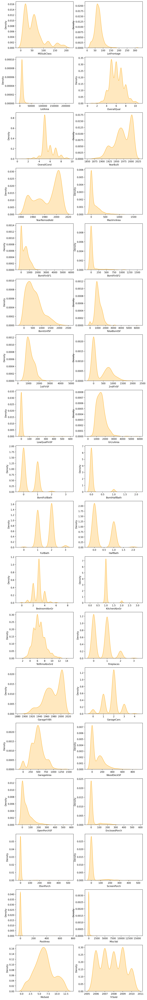

In [10]:
plt.figure(figsize=(10,80), dpi=200)
i=1
for col in numerical_df.columns[:-1]:
    plt.subplot(18,2,i)
    i+=1
    sns.kdeplot(color='orange', x=numerical_df[col], shade=True)

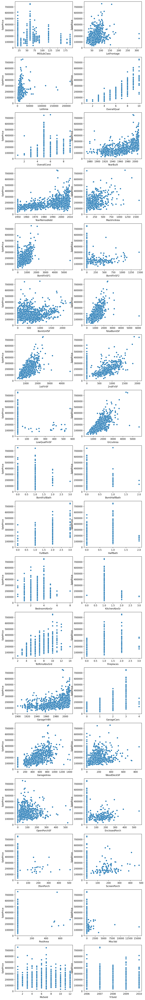

In [11]:
plt.figure(figsize=(10,80), dpi=200)
i=1
for col in numerical_df.columns[:-1]:
    plt.subplot(18,2,i)
    i+=1
    sns.scatterplot(y=numerical_df['SalePrice'], x=numerical_df[col])

### Categorical

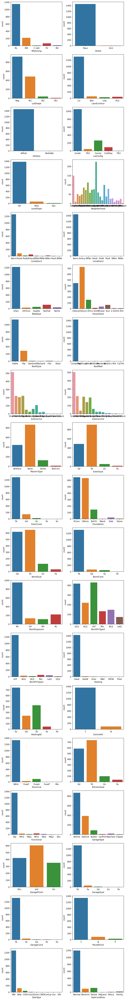

In [12]:
plt.figure(figsize=(10,90), dpi=200)
i=1
for col in categorial_df.columns:
    plt.subplot(19,2,i)
    i+=1
    sns.countplot(x=categorial_df[col])

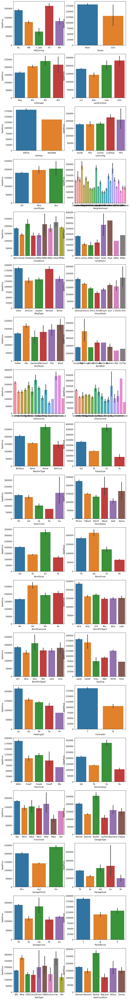

In [13]:
plt.figure(figsize=(10,90), dpi=200)
i=1
for col in categorial_df.columns:
    plt.subplot(19,2,i)
    i+=1
    sns.barplot(x=categorial_df[col], y=df.SalePrice)

### BoxPlot and Heatmap

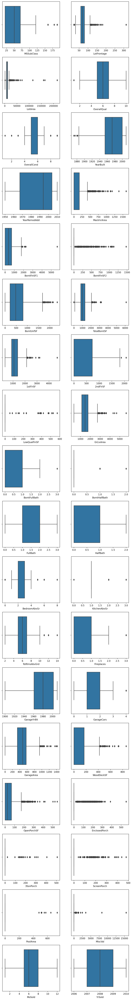

In [14]:
plt.figure(figsize=(10,80), dpi=200)
i=1
for col in numerical_df.columns[:-1]:
    plt.subplot(18,2,i)
    i+=1
    sns.boxplot(x=numerical_df[col])

In [15]:
df.skew()

MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchenAbvGr      4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.649415
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
SalePrice         1.882876
d

In [16]:
plt.figure(figsize=(40,40), dpi=300)
sns.heatmap(data=df.corr(), annot=True, cmap=plt.cm.Paired)

<AxesSubplot:>

# FEATURE ENGINNERING

### HNADLING NULL VALUES

#####                          NUMERICAL DF

In [17]:
missing = numerical_df.dropna().sample(numerical_df['GarageYrBlt'].isnull().values.sum())['GarageYrBlt']
missing.index = numerical_df[numerical_df.GarageYrBlt.isnull()].index
numerical_df.loc[numerical_df[numerical_df.GarageYrBlt.isnull()].index, 'GarageYrBlt'] = missing

In [18]:
missing = numerical_df.dropna().sample(numerical_df['LotFrontage'].isnull().values.sum())['LotFrontage']
missing.index = numerical_df[numerical_df.LotFrontage.isnull()].index
numerical_df.loc[numerical_df[numerical_df.LotFrontage.isnull()].index, 'LotFrontage'] = missing

In [19]:
missing = numerical_df.dropna().sample(numerical_df['MasVnrArea'].isnull().values.sum())['MasVnrArea']
missing.index = numerical_df[numerical_df.MasVnrArea.isnull()].index
numerical_df.loc[numerical_df[numerical_df.MasVnrArea.isnull()].index, 'MasVnrArea'] = missing

In [20]:
numerical_df.isnull().values.any()

False

##### CATEGORICAL DF

In [21]:
def handle_categorical_missing(datafram, column):
    missing = datafram.dropna().sample(datafram[column].isnull().values.sum())[column]
    missing.index = datafram[datafram[column].isnull()].index
    datafram.loc[datafram[datafram[col].isnull()].index, column] = missing

In [22]:
for col in ['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'GarageType','GarageFinish','GarageQual','GarageCond']:
    handle_categorical_missing(categorial_df, col)

In [23]:
categorial_df.isnull().values.any()

False

## Handling Outliers

In [24]:
def handling_outlier(dataframe, feature):
    median = dataframe[feature].median()
    quantile_1, quantile_3 = np.quantile(dataframe[feature], [0.25,0.75])
    IQR = quantile_3 - quantile_1
    lower_bound = quantile_1 - (1.5*IQR)
    upper_bound = quantile_3 + (1.5*IQR)
    dataframe.loc[dataframe[dataframe[feature]<lower_bound].index, feature] = lower_bound
    dataframe.loc[dataframe[dataframe[feature]>upper_bound].index, feature] = upper_bound

In [25]:
for col in numerical_df[:-1]:
    handling_outlier(numerical_df, col)

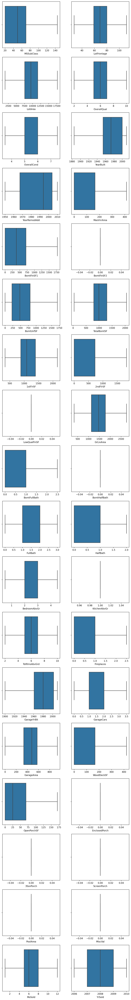

In [26]:
plt.figure(figsize=(10,80), dpi=200)
i=1
for col in numerical_df.columns[:-1]:
    plt.subplot(18,2,i)
    i+=1
    sns.boxplot(x=numerical_df[col])

In [27]:
numerical_df.drop(columns=['KitchenAbvGr', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'], axis=1, inplace=True)

### Convert categorial into numerical

In [28]:
from sklearn.preprocessing import OrdinalEncoder

column_names = categorial_df.columns

ordinal_encoder = OrdinalEncoder()
categorial_df = ordinal_encoder.fit_transform(categorial_df)
categorial_df = pd.DataFrame(data=categorial_df, columns=column_names)

In [29]:
categorial_df.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,3.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
1,3.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,...,4.0,3.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
2,3.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
3,3.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,...,4.0,2.0,6.0,5.0,2.0,4.0,4.0,2.0,8.0,0.0
4,3.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0


In [30]:
numerical_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
0,60,65.0,8450.0,7,5.0,2003,2003.0,196.0,706.0,0,...,8,0.0,2003.0,2.0,548.0,0,61,2.0,2008,208500.0
1,20,80.0,9600.0,6,7.5,1976,1976.0,0.0,978.0,0,...,6,1.0,1976.0,2.0,460.0,298,0,5.0,2007,181500.0
2,60,68.0,11250.0,7,5.0,2001,2002.0,162.0,486.0,0,...,6,1.0,2001.0,2.0,608.0,0,42,9.0,2008,223500.0
3,70,60.0,9550.0,7,5.0,1915,1970.0,0.0,216.0,0,...,7,1.0,1998.0,3.0,642.0,0,35,2.0,2006,140000.0
4,60,84.0,14260.0,8,5.0,2000,2000.0,350.0,655.0,0,...,9,1.0,2000.0,3.0,836.0,192,84,12.0,2008,250000.0


In [31]:
final_df = pd.concat([numerical_df, categorial_df], axis=1)
final_df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,60,65.0,8450.0,7,5.0,2003,2003.0,196.0,706.0,0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
1,20,80.0,9600.0,6,7.5,1976,1976.0,0.0,978.0,0,...,4.0,3.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
2,60,68.0,11250.0,7,5.0,2001,2002.0,162.0,486.0,0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0
3,70,60.0,9550.0,7,5.0,1915,1970.0,0.0,216.0,0,...,4.0,2.0,6.0,5.0,2.0,4.0,4.0,2.0,8.0,0.0
4,60,84.0,14260.0,8,5.0,2000,2000.0,350.0,655.0,0,...,4.0,2.0,6.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0


# X & Y

In [32]:
X = final_df.drop(axis=1,columns='SalePrice')
y= final_df.SalePrice

# Feature Selection

In [33]:
from sklearn.feature_selection import f_regression

In [34]:
f,p = f_regression(X,y)

In [35]:
select = pd.Series(data=p, index=X.columns).sort_values(ascending=True)

In [36]:
new_df = final_df[select.index[:25]]
new_df.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,ExterQual,1stFlrSF,FullBath,BsmtQual,KitchenQual,...,GarageYrBlt,MasVnrArea,LotArea,HeatingQC,Foundation,OpenPorchSF,BsmtFinSF1,GarageType,WoodDeckSF,LotFrontage
0,7,1710.0,2.0,548.0,856,2.0,856.0,2.0,2.0,2.0,...,2003.0,196.0,8450.0,0.0,2.0,61,706.0,1.0,0,65.0
1,6,1262.0,2.0,460.0,1262,3.0,1262.0,2.0,2.0,3.0,...,1976.0,0.0,9600.0,0.0,1.0,0,978.0,1.0,298,80.0
2,7,1786.0,2.0,608.0,920,2.0,920.0,2.0,2.0,2.0,...,2001.0,162.0,11250.0,0.0,2.0,42,486.0,1.0,0,68.0
3,7,1717.0,3.0,642.0,756,3.0,961.0,1.0,3.0,2.0,...,1998.0,0.0,9550.0,2.0,0.0,35,216.0,5.0,0,60.0
4,8,2198.0,3.0,836.0,1145,2.0,1145.0,2.0,2.0,2.0,...,2000.0,350.0,14260.0,0.0,2.0,84,655.0,1.0,192,84.0


In [37]:
X = new_df
y= final_df.SalePrice

# Standard Scaling

In [38]:
from sklearn.preprocessing import StandardScaler

In [39]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Splitting

In [40]:
from sklearn.model_selection import train_test_split

In [41]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=20, test_size=0.2)

# Model

In [42]:
from sklearn.metrics import r2_score, mean_squared_error
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import RidgeCV

In [43]:
xgb = XGBRegressor()
xgb.fit(x_train, y_train)
pred_xgb = xgb.predict(x_test)
print(r2_score(pred_xgb, y_test))
print(mean_squared_error(pred_xgb, y_test))

0.835992432996559
534526571.3819699


In [44]:
rfc = RandomForestRegressor()
rfc.fit(x_train, y_train)
pred_rfc = rfc.predict(x_test)
print(r2_score(pred_rfc, y_test))
print(mean_squared_error(pred_rfc, y_test))

0.8535699752427592
484646150.9459188


In [45]:
ridge = RidgeCV(cv=4)
ridge.fit(x_train, y_train)
pred_ridge = ridge.predict(x_test)
print(r2_score(pred_ridge, y_test))
print(mean_squared_error(pred_ridge, y_test))

0.8724823213020836
453301538.6446414
